In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

In [2]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim

In [3]:
df=pd.read_csv('data_pre/100219.csv')

In [4]:
df=df.drop(['Unnamed: 0'],axis=1)

In [5]:
nav=df['NAV']

In [6]:
nav

0       33.6900
1       33.9700
2       34.6100
3       34.1100
4       34.5700
5       33.6200
6       32.7800
7       33.6900
8       34.1600
9       34.2700
10      34.3700
11      34.2600
12      34.3300
13      33.7600
14      34.4300
15      34.0600
16      34.3100
17      35.4900
18      35.5600
19      35.3800
20      35.5100
21      35.6100
22      35.7400
23      35.7900
24      35.5500
25      35.2000
26      33.9900
27      33.9500
28      34.7900
29      32.3300
         ...   
3222    66.7230
3223    66.4614
3224    66.2782
3225    65.9340
3226    65.8424
3227    65.7955
3228    65.5237
3229    65.6797
3230    65.5629
3231    65.7752
3232    66.1370
3233    67.0887
3234    66.8554
3235    66.9051
3236    66.7354
3237    67.1852
3238    67.4354
3239    67.4036
3240    67.2958
3241    67.4749
3242    67.5088
3243    67.8605
3244    67.1983
3245    66.7872
3246    66.8749
3247    67.0263
3248    67.1048
3249    66.9817
3250    67.0388
3251    66.8400
Name: NAV, Length: 3252,

In [7]:
from sklearn.preprocessing import MinMaxScaler
sc = MinMaxScaler(feature_range = (0, 1))
training_set_scaled = sc.fit_transform(np.array(nav).reshape(-1,1))

In [8]:
training_set_scaled.shape

(3252, 1)

In [9]:
X_train = []
y_train = []
for i in range(60, 2500):
    X_train.append(training_set_scaled[i-60:i, 0])
    y_train.append(training_set_scaled[i, 0])
X_train, y_train = np.array(X_train), np.array(y_train)

In [19]:
X_train.shape

(2440, 60, 1)

In [12]:
#X_train[1]

In [17]:
#y_train

array([0.26005279, 0.26221005, 0.26279839, ..., 0.98276552, 0.98388533,
       0.97998659])

In [16]:
X_train = np.reshape(X_train, (X_train.shape[0], X_train.shape[1], 1))

In [17]:
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import LSTM
from keras.layers import Dropout

# Initialising the RNN
regressor = Sequential()

# Adding the first LSTM layer and some Dropout regularisation
regressor.add(LSTM(units = 50, return_sequences = True, input_shape = (X_train.shape[1], 1)))
regressor.add(Dropout(0.2))

# Adding a second LSTM layer and some Dropout regularisation
regressor.add(LSTM(units = 50, return_sequences = True))
regressor.add(Dropout(0.2))

# Adding a third LSTM layer and some Dropout regularisation
regressor.add(LSTM(units = 50, return_sequences = True))
regressor.add(Dropout(0.2))

# Adding a fourth LSTM layer and some Dropout regularisation
regressor.add(LSTM(units = 50))
regressor.add(Dropout(0.2))

# Adding the output layer
regressor.add(Dense(units = 1))

# Compiling the RNN
regressor.compile(optimizer = 'adam', loss = 'mean_squared_error')

# Fitting the RNN to the Training set
regressor.fit(X_train, y_train, epochs = 100, batch_size = 32)


Instructions for updating:
Use tf.cast instead.
Epoch 1/100
2440/2440 [==============================] - 38s 16ms/step - loss: 0.0198
Epoch 2/100
2440/2440 [==============================] - 35s 14ms/step - loss: 0.0037
Epoch 3/100
2440/2440 [==============================] - 37s 15ms/step - loss: 0.0034
Epoch 4/100
2440/2440 [==============================] - 38s 16ms/step - loss: 0.0032
Epoch 5/100
2440/2440 [==============================] - 37s 15ms/step - loss: 0.0029
Epoch 6/100
2440/2440 [==============================] - 39s 16ms/step - loss: 0.0027
Epoch 7/100
2440/2440 [==============================] - 38s 16ms/step - loss: 0.0025
Epoch 8/100
2440/2440 [==============================] - 38s 16ms/step - loss: 0.0023
Epoch 9/100
2440/2440 [==============================] - 38s 16ms/step - loss: 0.0024
Epoch 10/100
2440/2440 [==============================] - 36s 15ms/step - loss: 0.0024
Epoch 11/100
2440/2440 [==============================] - 36s 15ms/step - loss: 0.0022
Epoc

In [18]:
model_json = regressor.to_json()
with open("model.json", "w") as json_file:
    json_file.write(model_json)
# serialize weights to HDF5
regressor.save_weights("model.h5")
print("Saved model to disk")

Saved model to disk


In [27]:
X_train[-1]

array([[0.63119033],
       [0.64438291],
       [0.64562627],
       [0.64468688],
       [0.65047616],
       [0.64493791],
       [0.64760898],
       [0.65200977],
       [0.64273751],
       [0.64776979],
       [0.64860916],
       [0.65923853],
       [0.67145642],
       [0.67275469],
       [0.67305279],
       [0.65955427],
       [0.65760686],
       [0.67124069],
       [0.67095045],
       [0.6676322 ],
       [0.67234482],
       [0.65588694],
       [0.65659099],
       [0.64910925],
       [0.64942499],
       [0.66107612],
       [0.66510822],
       [0.68131898],
       [0.68853597],
       [0.68798293],
       [0.68845164],
       [0.6869043 ],
       [0.68204657],
       [0.69364866],
       [0.6951352 ],
       [0.67990892],
       [0.68037568],
       [0.67547283],
       [0.66823035],
       [0.66627902],
       [0.67044839],
       [0.66915797],
       [0.68298007],
       [0.68577665],
       [0.68131898],
       [0.68691019],
       [0.67847141],
       [0.683

In [38]:
training_set_scaled[2502]

array([0.72828824])

In [30]:
test_list=training_set_scaled[2500:]

In [32]:
inputs=training_set_scaled[len(training_set_scaled) - len(test_list) - 60:]

In [33]:
inputs = inputs.reshape(-1,1)

In [34]:
inputs

array([[0.64438291],
       [0.64562627],
       [0.64468688],
       [0.65047616],
       [0.64493791],
       [0.64760898],
       [0.65200977],
       [0.64273751],
       [0.64776979],
       [0.64860916],
       [0.65923853],
       [0.67145642],
       [0.67275469],
       [0.67305279],
       [0.65955427],
       [0.65760686],
       [0.67124069],
       [0.67095045],
       [0.6676322 ],
       [0.67234482],
       [0.65588694],
       [0.65659099],
       [0.64910925],
       [0.64942499],
       [0.66107612],
       [0.66510822],
       [0.68131898],
       [0.68853597],
       [0.68798293],
       [0.68845164],
       [0.6869043 ],
       [0.68204657],
       [0.69364866],
       [0.6951352 ],
       [0.67990892],
       [0.68037568],
       [0.67547283],
       [0.66823035],
       [0.66627902],
       [0.67044839],
       [0.66915797],
       [0.68298007],
       [0.68577665],
       [0.68131898],
       [0.68691019],
       [0.67847141],
       [0.68382728],
       [0.687

In [35]:
inputs.shape

(812, 1)

In [40]:
X_test = []

In [41]:
for i in range(60, 100):
    X_test.append(inputs[i-60:i, 0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0], X_test.shape[1], 1))

In [51]:
temp=sc.inverse_transform(test_list[:40])
predicted_stock_price = regressor.predict(X_test)
predicted_stock_price = sc.inverse_transform(predicted_stock_price)

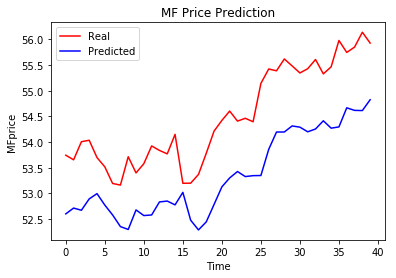

In [52]:
plt.plot(temp, color = 'red', label = 'Real')
plt.plot(predicted_stock_price, color = 'blue', label = 'Predicted')
plt.title('MF Price Prediction')
plt.xlabel('Time')
plt.ylabel('MFprice')
plt.legend()
plt.show()

In [46]:
predicted_stock_price.shape

(40, 1)

In [77]:
ip=X_test[-1]

In [78]:
op=regressor.predict(ip.reshape(-1,60,1))

In [66]:
op

array([[0.74433887]], dtype=float32)

In [132]:
test=list(training_set_scaled[2500:2560])

In [133]:
len(test)

60

In [134]:
for i in range(0,40):
    ip=test[i:i+60]
    print(len(ip))
    ip=np.array(ip)
    ip=ip.reshape(-1,60,1)
    op=regressor.predict(ip)
    test.append(op)

60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60


In [135]:
# for elem in test:
#     print(type(elem))

In [136]:
op1=test[60:]

In [138]:
#op1=op1.ravel()

AttributeError: 'list' object has no attribute 'ravel'

In [137]:
len(op1)

40

In [148]:
(op2[2])

array(0.710286, dtype=float32)

In [145]:
op2=[]

In [146]:
for elem in op1:
    #elem=elem.squeeze()
    e=np.squeeze(elem)
    op2.append(e)

In [115]:
for elem in op1:
    elem=float(elem)
    print(type(elem),elem)
op1

<class 'float'> 0.7385387420654297
<class 'float'> 0.7244057655334473
<class 'float'> 0.710286021232605
<class 'float'> 0.6988493204116821
<class 'float'> 0.6894057989120483
<class 'float'> 0.6809322834014893
<class 'float'> 0.6727839708328247
<class 'float'> 0.6647213697433472
<class 'float'> 0.6567516326904297
<class 'float'> 0.6489667892456055
<class 'float'> 0.6414463520050049
<class 'float'> 0.6342243552207947
<class 'float'> 0.6272951364517212
<class 'float'> 0.620631992816925
<class 'float'> 0.6142028570175171
<class 'float'> 0.6079795360565186
<class 'float'> 0.6019401550292969
<class 'float'> 0.5960680842399597
<class 'float'> 0.5903503894805908
<class 'float'> 0.5847761631011963
<class 'float'> 0.5793355703353882
<class 'float'> 0.5740196704864502
<class 'float'> 0.5688202977180481
<class 'float'> 0.5637302398681641
<class 'float'> 0.5587431192398071
<class 'float'> 0.5538533329963684
<class 'float'> 0.5490561127662659
<class 'float'> 0.5443471670150757
<class 'float'> 0.5397

[array([[0.73853874]], dtype=float32),
 array([[0.72440577]], dtype=float32),
 array([[0.710286]], dtype=float32),
 array([[0.6988493]], dtype=float32),
 array([[0.6894058]], dtype=float32),
 array([[0.6809323]], dtype=float32),
 array([[0.672784]], dtype=float32),
 array([[0.66472137]], dtype=float32),
 array([[0.65675163]], dtype=float32),
 array([[0.6489668]], dtype=float32),
 array([[0.64144635]], dtype=float32),
 array([[0.63422436]], dtype=float32),
 array([[0.62729514]], dtype=float32),
 array([[0.620632]], dtype=float32),
 array([[0.61420286]], dtype=float32),
 array([[0.60797954]], dtype=float32),
 array([[0.60194016]], dtype=float32),
 array([[0.5960681]], dtype=float32),
 array([[0.5903504]], dtype=float32),
 array([[0.58477616]], dtype=float32),
 array([[0.5793356]], dtype=float32),
 array([[0.5740197]], dtype=float32),
 array([[0.5688203]], dtype=float32),
 array([[0.56373024]], dtype=float32),
 array([[0.5587431]], dtype=float32),
 array([[0.55385333]], dtype=float32),
 a

In [116]:
op1

[array([[0.73853874]], dtype=float32),
 array([[0.72440577]], dtype=float32),
 array([[0.710286]], dtype=float32),
 array([[0.6988493]], dtype=float32),
 array([[0.6894058]], dtype=float32),
 array([[0.6809323]], dtype=float32),
 array([[0.672784]], dtype=float32),
 array([[0.66472137]], dtype=float32),
 array([[0.65675163]], dtype=float32),
 array([[0.6489668]], dtype=float32),
 array([[0.64144635]], dtype=float32),
 array([[0.63422436]], dtype=float32),
 array([[0.62729514]], dtype=float32),
 array([[0.620632]], dtype=float32),
 array([[0.61420286]], dtype=float32),
 array([[0.60797954]], dtype=float32),
 array([[0.60194016]], dtype=float32),
 array([[0.5960681]], dtype=float32),
 array([[0.5903504]], dtype=float32),
 array([[0.58477616]], dtype=float32),
 array([[0.5793356]], dtype=float32),
 array([[0.5740197]], dtype=float32),
 array([[0.5688203]], dtype=float32),
 array([[0.56373024]], dtype=float32),
 array([[0.5587431]], dtype=float32),
 array([[0.55385333]], dtype=float32),
 a

In [103]:
real_op2=training_set_scaled[2560:2600]
for elem in real_op2:
    print(type(elem))

<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>


In [111]:
real_op2.shape

(40, 1)

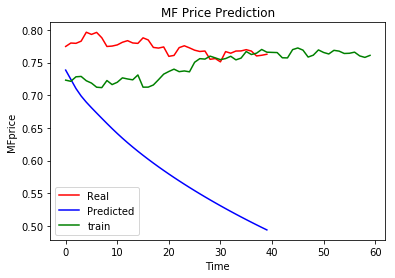

In [150]:
plt.plot(real_op2, color = 'red', label = 'Real')
plt.plot(op2, color = 'blue', label = 'Predicted')
plt.plot(training_set_scaled[2500:2560],color='green',label='train')
plt.title('MF Price Prediction')
plt.xlabel('Time')
plt.ylabel('MFprice')
plt.legend()
plt.show()

In [151]:
!pip install dash dash-renderer dash-html-components dash-core-components plotly 

     |████████████████████████████████| 61kB 99kB/s  eta 0:00:01
     |████████████████████████████████| 2.5MB 71kB/s eta 0:00:013
     |████████████████████████████████| 194kB 147kB/s eta 0:00:01
     |████████████████████████████████| 2.2MB 252kB/s eta 0:00:01
     |████████████████████████████████| 7.1MB 152kB/s eta 0:00:01
     |████████████████████████████████| 1.8MB 254kB/s eta 0:00:01
  Created wheel for dash: filename=dash-1.2.0-cp37-none-any.whl size=66371 sha256=2df1097a75bf6bf20f55d360c6a359c90ceec73c83db8fcf7aca1a0566de7bf0
  Stored in directory: /home/rishabh/.cache/pip/wheels/22/23/2d/c152b7ac7082146d946b54a87be873f695dab880f39d85aa62
  Created wheel for dash-renderer: filename=dash_renderer-1.0.1-cp37-none-any.whl size=2563550 sha256=884abbbe243e9d2e35f7809b04ac93eef454256707c4f4aed93e657d81836061
  Stored in directory: /home/rishabh/.cache/pip/wheels/df/81/47/0a075f77aad1b4618294c1086be1c555a00d1078975f94dc76
  Created wheel for dash-html-components: filename=dash_html_

In [ ]:
temp=te

In [74]:
#tempty

In [85]:
type(X_test[1][1])

numpy.ndarray

In [86]:
X_test[3][1]

array([0.64493791])

In [87]:
test

array([[0.72313241],
       [0.72136935],
       [0.72828824],
       [0.72885305],
       [0.7222244 ],
       [0.71867866],
       [0.71232654],
       [0.71170682],
       [0.72254799],
       [0.71636452],
       [0.71988476],
       [0.72667618],
       [0.72496607],
       [0.72364819],
       [0.73110051],
       [0.71240498],
       [0.71244421],
       [0.71576833],
       [0.72387764],
       [0.73235172],
       [0.73643677],
       [0.74000996],
       [0.73616613],
       [0.7372526 ],
       [0.73591707],
       [0.75058442],
       [0.7561011 ],
       [0.7554049 ],
       [0.75992532],
       [0.75728171],
       [0.75458122],
       [0.75621092],
       [0.75972136],
       [0.75423606],
       [0.75692674],
       [0.76700699],
       [0.76242381],
       [0.76446732],
       [0.77014873],
       [0.76600093],
       [0.76568322],
       [0.76541062],
       [0.75743271],
       [0.75722679],
       [0.7699487 ],
       [0.77245895],
       [0.76916424],
       [0.758

In [152]:
import plotly
print(plotly.__version__)  # version >1.9.4 required
from plotly.graph_objs import Scatter, Layout
plotly.offline.plot({
"data": [
    Scatter(x=[1, 2, 3, 4], y=[4, 1, 3, 7])
],
"layout": Layout(
    title="hello world"
)
})

4.1.1


'temp-plot.html'

In [153]:
import plotly.graph_objects as go
fig = go.Figure(data=go.Bar(y=[2, 3, 1]))

In [154]:
fig.write_html('first_figure.html', auto_open=True)

In [155]:
fig = go.Figure(data=go.Bar(y=[2, 3, 1]))
fig.show()

In [157]:
fig = go.FigureWidget(data=go.Bar(y=[2, 3, 1]))
fig

FigureWidget({
    'data': [{'type': 'bar', 'uid': '9b8ff1a6-955e-4c47-9512-fca209c273d7', 'y': [2, 3, 1]}],
 …

In [158]:
N = 100000

In [159]:
x=np.random.randn(N)

In [161]:
type(x)

numpy.ndarray

In [165]:
x

array([-2.18394946,  0.41083703,  0.38473907, ..., -0.48322589,
       -1.34348599, -1.27897158])

In [167]:
import plotly.express as px


In [168]:
np.random.seed(1)

N = 100000

df = pd.DataFrame(dict(x=np.random.randn(N),
                       y=np.random.randn(N)))

fig = px.scatter(df, x="x", y="y", render_mode='webgl')

fig.update_traces(marker_line=dict(width=1, color='DarkSlateGray'))

fig.show()